# Vectorise and analyse waterbodies in Kenya

* **Products used:** 
[wofs_ls_summary_annual](https://explorer.digitalearth.africa/wofs_ls_summary_annual)

## Background

This notebook detects waterbodies in a given area based on a threshold % of water observations. It then vectorises these waterbodies and exports the results as a shapefile. This can be used for inspecting and investigating the waterbodies in an area. Finally, a timeseries of the average frequency (% of the time) water is observed across years is shown for a selected waterbody.

## Description

1. Define parameters for waterbody detection.
2. Load the area of interest- a region in Kenya.
3. Load WOfS for the region.
4. Vectorise and export waterbodies to shapefile.
5. Inspect a specific waterbody and plot a timeseries.

***

## Getting started

 To run this analysis, run all the cells in the notebook, starting with the "Load packages" cell. 

### Load packages
Import Python packages that are used for the analysis.

In [1]:
%matplotlib inline

# Force GeoPandas to use Shapely instead of PyGEOS
# In a future release, GeoPandas will switch to using Shapely by default.
import os
os.environ['USE_PYGEOS'] = '0'

from pathlib import Path

import rasterio.features
from shapely.geometry import Polygon, shape, mapping, MultiPolygon
from shapely.ops import unary_union
from datacube.utils.geometry import Geometry, CRS
import geopandas as gpd
import fiona
from fiona.crs import from_epsg
import xarray as xr
import pandas as pd
import glob
import os.path
import math
import geohash as gh
import re
import datacube
import seaborn as sns
import rioxarray
import matplotlib.pyplot as plt
import numpy as np

from deafrica_tools.spatial import xr_vectorize, xr_rasterize
from deafrica_tools.datahandling import wofs_fuser, mostcommon_crs
from deafrica_tools.plotting import map_shapefile

### Connect to the datacube

Connect to the datacube so we can access DE Africa data.

In [2]:
dc = datacube.Datacube(app='vectorise_waterbodies')

### Threshold for waterbody detection

Create a `minimum_wet_percentage` value corresponding to the proportion of wet counts above which an area will be classified as a waterbody. This percentage refers to time, i.e. the percentage of time a pixel is wet. It will be applied to the average frequency (%) calculated across the years 2000 to 2021.

In [3]:
minimum_wet_percentage = [0.25]

We now define the range of area (m<sup>2</sup>) we want the waterbodies to fall within. We will use the values to filter the waterbodies detected.

In [4]:
min_area_m2 = 10000
max_area_m2 = 1500000

We can also threshold the minimum valid observations we need to determine that wet observations are waterbodies. Again, will be applied to the average count of clear observations, `count_clear`, calculated across the years 2000 to 2021. The default value is an average of 5 valid observations per year.

In [5]:
min_valid_observations = 5

apply_min_valid_observations_first = True

## Load and plot area of interest

We have a geojson file which defines a polygon for the area of interest for this analysis. We can see the county name and other details below. We can then plot the bounds of the area and map the shapefile to see the area we are working on.

In [6]:
area = gpd.read_file('data/ccy.geojson').to_crs("epsg:6933")
area

,County,ConsrvName,AreaHa,iddddd,geometry
0,Isiolo,Naapu,28143.325296731,1,"MULTIPOLYGON (((3688221.493 188693.113, 368780..."


In [7]:
geom = Geometry(geom=area.iloc[0].geometry, crs="epsg:6933")

In [8]:
map_shapefile(area, attribute = area.columns[0])

Label(value='')

Map(center=[1.1587555787451724, 37.752218372858266], controls=(ZoomControl(options=['position', 'zoom_in_text'…

### Set up export directory

We need to set up a folder to export our shapefile results into. We will create a base filename that can be referred to when writing files and store a filepath object to the export folder. 

In [9]:
base_filename = 'waterbodies'

intermediate_wb_path = Path('_wb_outputs/')

The cell below clears the export directory if it already exists, then makes a new directory for storing waterbody outputs.

In [10]:
%%bash
rm -rf _wb_outputs
mkdir _wb_outputs

## Generate query and load WOfS

Define the query that we will use to load the WOfS data. We will use 2000 to 2021 so our analysis is based on a recent time period. 

In [11]:
resolution = (-30, 30)# This is the resolution of WOfS, which changes depending on which collection you use.
time_range = ('2000-01-01', '2021-12-31')

# how to chunk the dataset for use with dask
dask_chunks = {'x': 3000, 'y': 3000, 'time': 1}

The `wofs_ls_summary_annual` gives summary water observations on an annual basis. 

In [12]:
query = {
    "geopolygon": geom,
    "resolution": resolution,
    "time": time_range,
    "dask_chunks": dask_chunks
}
output_crs = mostcommon_crs(dc=dc, product='wofs_ls_summary_annual', query=query)

# Then load the WOfS summary of clear/wet observations:
wofls = dc.load(product = 'wofs_ls_summary_annual', output_crs=output_crs,
               **query)


# And set the no-data values to nan:
wofls = wofls.where(wofls != -1)
print(wofls)

<xarray.Dataset>
Dimensions:      (time: 22, y: 7651, x: 5756)
Coordinates:
  * time         (time) datetime64[ns] 2000-07-01T23:59:59.999999 ... 2021-07...
  * y            (y) float64 2.625e+05 2.625e+05 ... 3.308e+04 3.304e+04
  * x            (x) float64 3.556e+06 3.556e+06 ... 3.729e+06 3.729e+06
    spatial_ref  int32 6933
Data variables:
    count_wet    (time, y, x) float32 dask.array<chunksize=(1, 3000, 3000), meta=np.ndarray>
    count_clear  (time, y, x) float32 dask.array<chunksize=(1, 3000, 3000), meta=np.ndarray>
    frequency    (time, y, x) float32 dask.array<chunksize=(1, 3000, 3000), meta=np.ndarray>
Attributes:
    crs:           epsg:6933
    grid_mapping:  spatial_ref


### Aggregate to mean across the period of interest

Calculate the annual average of `count_wet`, `count_clear`, and `frequency` across the period 2000 to 2021.

In [13]:
wofls_lt = wofls.mean(dim='time')

### Mask to area of interest

In [14]:
mask = xr_rasterize(area, wofls_lt) 
wofls_lt = wofls_lt.where(mask) # select WOfS obersations within the area of interest

## Vectorise polygons where average frequency exceeds the threshold

Now we can identify areas where the average `frequency` of wet observations exceeds the threshold (`minimum_wet_percentage`) and convert them to polygons using `xr_vectorize`. Polygons that overlap are merged, then finally the shapefile of all waterbodies detected is exported in the directory we created.

In [15]:
# Filter pixels with at least the minimum valid observations.
wofs_valid_filtered = wofls_lt.count_clear >= min_valid_observations

# Remove any pixels that are wet less than the minimum wetness percentage of the time
wofs_filtered = wofls_lt.frequency > minimum_wet_percentage

# Now find pixels that meet both the minimum valid observations and wetness percentage criteria
# Change all zeros to NaN to create a nan/1 mask layer
# Pixels == 1 now represent our water bodies
if apply_min_valid_observations_first:
    wofs_filtered = wofs_filtered.where(wofs_filtered & wofs_valid_filtered)
else:
    wofs_filtered = wofs_filtered.where(wofs_filtered)
    
# Vectorise the raster.
polygons = xr_vectorize((wofs_filtered == 1), crs='EPSG:6933')
polygons = polygons[polygons.attribute == 1].reset_index(drop=True)

# Combine any overlapping polygons
polygons = polygons.geometry.buffer(0).unary_union

# Turn the combined multipolygon back into a geodataframe
polygons = gpd.GeoDataFrame(
geometry=list(polygons.geoms))
# We need to add the crs back onto the dataframe
polygons.crs = 'EPSG:6933'

# Calculate the area of each polygon again now that overlapping polygons
# have been merged
polygons['area'] = polygons.area
    
# Save the polygons to a shapefile
filename = intermediate_wb_path / f'{base_filename}_raw_{minimum_wet_percentage}.shp'
polygons.to_file(filename)

## Combine overlapping polygons based on minimum and maximum areas

Now we will use the `min_area_m2` and `max_area_m2` values we defined above to filter the waterbodies collection. This workflow was originally designed for continental applications so some aspects related to very large polygons are less relevant to this use case, though we will leave the code in the workflow for completeness. 

The reads the waterbodies we exported back into the notebook then filters waterbodies that exceed or fall below our area thresholds. It then identifies small waterbodies that fall below the area threshold but overlap with other waterbodies, and adds them to the final dataset. 

Summary statistics (area, perimeter, and [Polsby-Popper](https://en.wikipedia.org/wiki/Polsby%E2%80%93Popper_test)) are added to the dataset before it is exported again and overwrites the previous shapefiles.

In [16]:
polygons = gpd.read_file(filename)

threshold = minimum_wet_percentage[0]

assert minimum_wet_percentage[0] == max(minimum_wet_percentage)
polygons = gpd.read_file(filename)

# Filter polygons by size.
polygons = polygons[
    (polygons['area'] >= min_area_m2) & (polygons['area'] <= max_area_m2)]

# Combine detected polygons with their maximum extent boundaries.
lower_threshold = gpd.read_file(filename)
lower_threshold['area'] = pd.to_numeric(lower_threshold.area)

# Filter out those pesky huge polygons
lower_threshold = lower_threshold.loc[
    (lower_threshold['area'] <= max_area_m2)]
lower_threshold['lt_index'] = range(len(lower_threshold))

# Pull out the polygons from the extent shapefile that intersect with the detection shapefile
overlay_extent = gpd.overlay(polygons, lower_threshold, keep_geom_type=True)
lower_threshold_to_use = lower_threshold.loc[overlay_extent.lt_index]

# Combine the polygons
polygons = gpd.GeoDataFrame(
    pd.concat([lower_threshold_to_use, polygons], ignore_index=True))

# Merge overlapping polygons
polygons = polygons.unary_union

# Back into individual polygons
polygons = gpd.GeoDataFrame(crs='EPSG:6933', geometry=[polygons]).explode(index_parts=True)

# Get rid of the multiindex that explode added:
polygons = polygons.reset_index(drop=True)

# Add area, perimeter, and polsby-popper columns:
polygons['area'] = polygons.area
polygons['perimeter'] = polygons.length
polygons['pp_test'] = polygons.area * 4 * math.pi / polygons.perimeter ** 2

# Dump the merged polygons to a file:
polygons.to_file(f'_wb_outputs/{base_filename}_merged.shp', overwrite=True)

## Load and inspect merged waterbodies

Now we can load the waterbodies we stored above and inspect the results. The cell below reads the shapefile we exported and displays the summary statistics, geometry, and ID column which we can use to access specific waterbodies.

In [17]:
waterbodies = gpd.read_file('_wb_outputs/waterbodies_merged.shp')
waterbodies['ID'] = waterbodies.index
waterbodies

,area,perimeter,pp_test,geometry,ID
0,16200.0,600.0,0.565487,"POLYGON ((3569100.000 65490.000, 3569070.000 6...",0
1,56700.0,3540.0,0.056857,"POLYGON ((3603840.000 79620.000, 3603840.000 7...",1
2,38700.0,2340.0,0.088816,"POLYGON ((3603240.000 81270.000, 3603240.000 8...",2
3,11700.0,840.0,0.208371,"POLYGON ((3602670.000 82530.000, 3602760.000 8...",3
4,13500.0,960.0,0.184078,"POLYGON ((3602190.000 82590.000, 3602190.000 8...",4
...,...,...,...,...,...
57,20700.0,1320.0,0.149291,"POLYGON ((3712500.000 110910.000, 3712500.000 ...",57
58,14400.0,780.0,0.297429,"POLYGON ((3713460.000 111690.000, 3713460.000 ...",58
59,24300.0,1680.0,0.108193,"POLYGON ((3717270.000 114510.000, 3717270.000 ...",59
60,18900.0,1200.0,0.164934,"POLYGON ((3717960.000 116430.000, 3717960.000 ...",60


We can plot the shapefile to visualise the waterbodies, or we can explore with a satellite basemap.

The cell below shows most waterbodies follow a river system.

<Axes: >

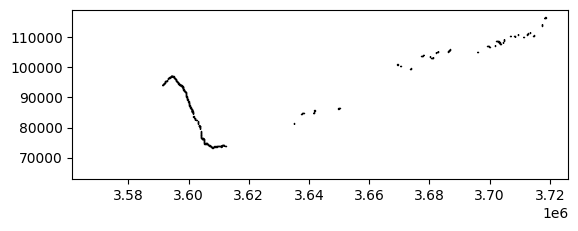

In [18]:
waterbodies.plot(edgecolor='k')

Mapping the shapefile with the code below displays the waterbodies in blue over a satellite basemap. Zooming in shows the analysis has captured the river system.

In [19]:
map_shapefile(waterbodies, attribute = waterbodies.columns[0])

Label(value='')

Map(center=[0.7132592538820504, 37.7651101330144], controls=(ZoomControl(options=['position', 'zoom_in_text', …

### Select a waterbody for further analysis

We can use the `.explore()` function to find and select a waterbody for further analysis. Although most waterbodies follow the river system, we can see there is an isolated waterbody at `0.513, 36.989`.

Inspecting the exploration map below, we can see that this is waterbody with `ID` = `0` and a perimeter of 600m, located near Tura.

In [20]:
waterbodies.explore()

### Further analysis

We can select the waterbody we identified above for further analysis using index selection.

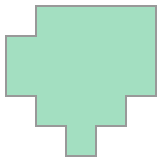

In [21]:
geom = Geometry(geom=waterbodies.iloc[0].geometry, crs="epsg:6933")
geom

We can mask the WOfS annual summary to the selected polygon.

In [22]:
waterbody_ID = 0
    
geom = Geometry(waterbodies.iloc[waterbody_ID].geometry, crs='epsg:6933')

mask = rasterio.features.geometry_mask(
            [geom.to_crs(wofls.geobox.crs) for geoms in [geom]],
            out_shape=wofls.geobox.shape,
            transform=wofls.geobox.affine,
            all_touched=False,
            invert=True)
mask = xr.DataArray(mask, dims=("y", "x"))

wofl_masked = wofls.where(mask, drop=True)

We can inspect the distribution of frequency; the proportion of times in each year the pixel was observed as wet, across each year for our selected waterbody.

This shows that the middle of the waterbody was consistently wet between 2007 and 2010, but the wettest part of the waterbody was only wet for around 60-70% of the time in 2021.

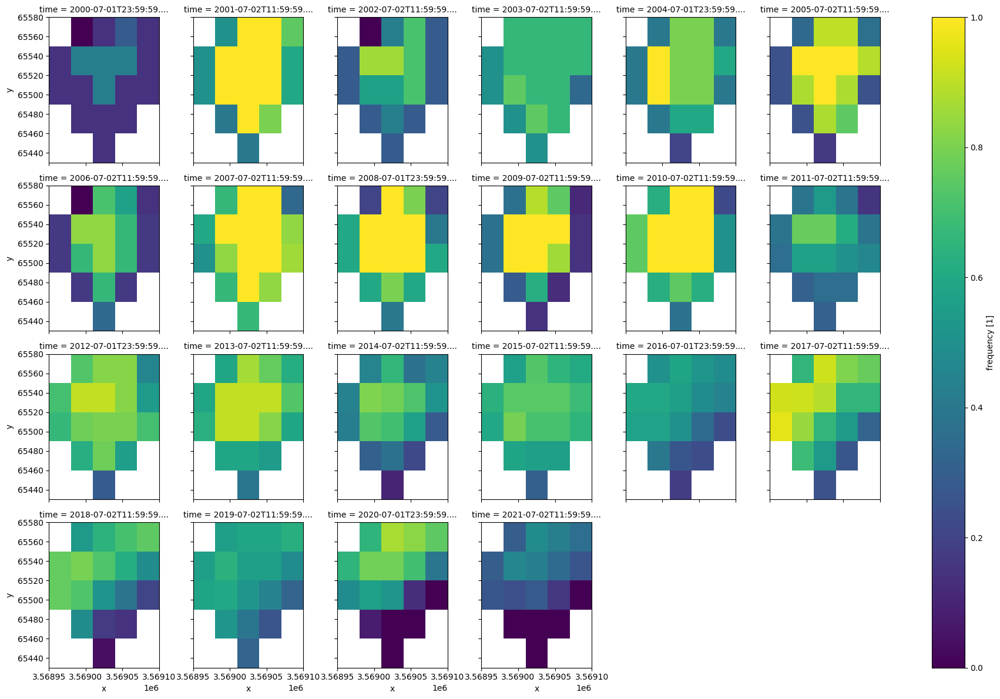

In [23]:
wofl_masked.frequency.isel().plot(col="time", col_wrap=6)

Finally, we can collapse the space dimension and plot the average frequency shown above over a timeseries.

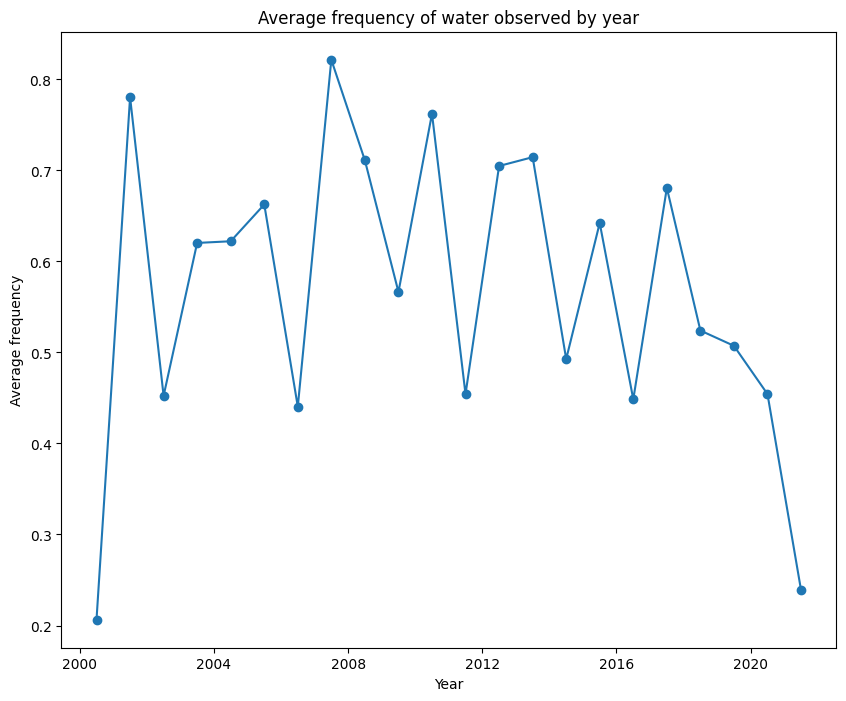

In [24]:
wofl_ts = wofl_masked.mean(['x','y'])

plt.figure(figsize = [10,8])
plt.plot(wofl_ts.time, wofl_ts.frequency, '-o')
plt.xlabel('Year')
plt.ylabel('Average frequency')
plt.title('Average frequency of water observed by year');

***

## Additional information

**License:** The code in this notebook is licensed under the [Apache License, Version 2.0](https://www.apache.org/licenses/LICENSE-2.0). 
Digital Earth Africa data is licensed under the [Creative Commons by Attribution 4.0](https://creativecommons.org/licenses/by/4.0/) license.

**Contact:** If you need assistance, please post a question on the [Open Data Cube Slack channel](http://slack.opendatacube.org/) or on the [GIS Stack Exchange](https://gis.stackexchange.com/questions/ask?tags=open-data-cube) using the `open-data-cube` tag (you can view previously asked questions [here](https://gis.stackexchange.com/questions/tagged/open-data-cube)).
If you would like to report an issue with this notebook, you can file one on [Github](https://github.com/digitalearthafrica/deafrica-sandbox-notebooks).

**Compatible datacube version:** 

In [25]:
print(datacube.__version__)

1.8.15


**Last Tested:**

In [26]:
from datetime import datetime
datetime.today().strftime('%Y-%m-%d')

'2023-09-19'